# Make-a-Shape Demo

Code d'inference pour les modeles **Make-a-Shape** (Autodesk AILab).

**Depot clone dans ce notebook :** [635jack/Make-a-Shape](https://github.com/635jack/Make-a-Shape)

Usage recherche / academique uniquement. Page projet amont : [AutodeskAILab/Make-a-Shape](https://github.com/AutodeskAILab/Make-a-Shape).

[Licence](https://github.com/635jack/Make-a-Shape/blob/main/LICENSE)


In [1]:
import os
from pathlib import Path

# charge hf-tok : souvent rate si le kernel ne demarre pas sous le bon cwd ^^

def _apply_token(raw):
	raw = raw.strip()
	os.environ["HF_TOKEN"] = raw
	os.environ["HUGGING_FACE_HUB_TOKEN"] = raw  # certains outils ne lisent que celui-la


def _load_hf_token():
	if os.environ.get("HF_TOKEN"):
		os.environ.setdefault("HUGGING_FACE_HUB_TOKEN", os.environ["HF_TOKEN"])
		return True
	if os.environ.get("HUGGING_FACE_HUB_TOKEN"):
		os.environ.setdefault("HF_TOKEN", os.environ["HUGGING_FACE_HUB_TOKEN"])
		return True

	explicit = os.environ.get("HF_TOK_PATH")
	if explicit:
		p = Path(explicit).expanduser().resolve()
		if p.is_file():
			_apply_token(p.read_text())
			return True

	# monorepo typique : .../Repo/hf-tok et .../Repo/Make-a-Shape/run.py
	cw = Path.cwd().resolve()
	if (cw / "run.py").is_file():
		up = cw.parent / "hf-tok"
		if up.is_file():
			_apply_token(up.read_text())
			return True

	p = cw
	for _ in range(24):
		f = p / "hf-tok"
		if f.is_file():
			_apply_token(f.read_text())
			return True
		if p.parent == p:
			break
		p = p.parent

	print("pas de hf-tok : cwd=", cw)
	print("  -> mets hf-tok au dessus de Make-a-Shape, ou export HF_TOKEN, ou HF_TOK_PATH=/chemin/vers/hf-tok")
	return False


if _load_hf_token():
	print("hf_token ok")
else:
	print("hub anonyme (warning hf possible)")


pas de hf-tok -> hub anonyme


# Download source code and setup environment

In [2]:
# Clone source code (fork 635jack)
!git clone https://github.com/635jack/Make-a-Shape.git


Cloning into 'Make-a-Shape'...
remote: Enumerating objects: 149, done.
remote: Counting objects: 100% (60/60), done.
remote: Compressing objects: 100% (39/39), done.
remote: Total 149 (delta 27), reused 38 (delta 18), pack-reused 89 (from 1)
Receiving objects: 100% (149/149), 11.64 MiB | 13.38 MiB/s, done.
Resolving deltas: 100% (38/38), done.


In [3]:
# Setup conda
!pip install -q condacolab
import condacolab
condacolab.install()

⏬ Downloading https://github.com/jaimergp/miniforge/releases/download/24.11.2-1_colab/Miniforge3-colab-24.11.2-1_colab-Linux-x86_64.sh...
📦 Installing...


KeyboardInterrupt: 

In [ ]:
# Setup environment
!conda create -n make-a-shape python==3.10
!source activate make-a-shape
%cd Make-a-Shape
!pip install -r requirements.txt
!pip install trimesh plotly matplotlib

Channels:
 - conda-forge
Platform: linux-64
Solving environment: done


==> WARNING: A newer version of conda exists. <==
    current version: 24.11.2
    latest version: 26.3.2

Please update conda by running

    $ conda update -n base -c conda-forge conda



## Package Plan ##

  environment location: /usr/local/envs/make-a-shape

  added / updated specs:
    - python==3.10


The following NEW packages will be INSTALLED:

  _openmp_mutex      conda-forge/linux-64::_openmp_mutex-4.5-20_gnu 
  bzip2              conda-forge/linux-64::bzip2-1.0.8-hda65f42_9 
  ca-certificates    conda-forge/noarch::ca-certificates-2026.4.22-hbd8a1cb_0 
  ld_impl_linux-64   conda-forge/linux-64::ld_impl_linux-64-2.45.1-default_hbd61a6d_102 
  libffi             conda-forge/linux-64::libffi-3.4.6-h2dba641_1 
  libgcc             conda-forge/linux-64::libgcc-15.2.0-he0feb66_19 
  libgcc-ng          conda-forge/linux-64::libgcc-ng-15.2.0-h69a702a_19 
  libgomp            conda-forge/linux-64::libgomp-15.2.

: 

# Inference

## Define helper functions

In [ ]:
# Install trimesh if not already installed, ensuring it's installed for the current kernel's Python interpreter.
import sys
!{sys.executable} -m pip install trimesh

# Define helper functions to display images, voxels and 3D meshs
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import trimesh
import plotly.graph_objs as go
import plotly.io as pio
pio.renderers.default = "notebook_connected"
import numpy as np
import json
import glob


def display_image(image_file):
  img = mpimg.imread(image_file)
  plt.imshow(img)
  plt.axis('off')  # Hide the axes
  plt.show()


def display_images(image_files):
  num_images = len(image_files)

  if num_images < 1 or num_images > 4:
      raise ValueError("Number of images must be between 1 and 4")

  # Create a single row of subplots
  fig, axes = plt.subplots(1, num_images, figsize=(5 * num_images, 5))

  # If there's only one image, `axes` is not a list, so make it iterable
  if num_images == 1:
      axes = [axes]

  # Display each image
  for ax, image_file in zip(axes, image_files):
      img = mpimg.imread(image_file)
      ax.imshow(img)
      ax.axis('off')  # Hide the axes

  plt.tight_layout()
  plt.show()


def display_mesh(mesh_file):
  mesh = trimesh.load(mesh_file)
  vertices = mesh.vertices
  faces = mesh.faces

  fig = go.Figure(data=[
      go.Mesh3d(
          x=vertices[:, 0],
          y=vertices[:, 1],
          z=vertices[:, 2],
          i=faces[:, 0],
          j=faces[:, 1],
          k=faces[:, 2],
          color='#B4B7C2',
          # opacity=0.50
          lighting=dict(ambient=0.5, diffuse=1, specular=0.5, roughness=0.5),
      )
  ])
  fig.update_layout(scene=dict(
      xaxis=dict(visible=False),
      yaxis=dict(visible=False),
      zaxis=dict(visible=False),
      aspectmode='data',  # Ensures the aspect ratio is correct
      bgcolor='white',
      # camera=dict(
      #     eye=dict(x=2.5, y=2.5, z=2.5)  # Adjust these values to zoom out
      # )
  ))
  fig.show()


def display_voxel(voxel_file):
    with open(voxel_file, "r") as f:
        voxel_json = json.load(f)
    occupancy = voxel_json["occupancy"]
    color = voxel_json["color"]
    voxel_resolution = voxel_json["resolution"]
    occupancy_arr = np.array(occupancy)
    voxelarray = np.zeros(
        [voxel_resolution + 1, voxel_resolution + 1, voxel_resolution + 1]
    )
    voxelarray[occupancy_arr[:, 0], occupancy_arr[:, 1], occupancy_arr[:, 2]] = 1.0
    facecolors = "#B4B7C2"
    fig = plt.figure()
    ax = fig.add_subplot(projection="3d")
    ax.voxels(voxelarray, facecolors=facecolors, edgecolor="k")
    plt.axis("off")

    plt.show()

  Using cached trimesh-4.12.2-py3-none-any.whl.metadata (13 kB)
Using cached trimesh-4.12.2-py3-none-any.whl (741 kB)


: 

## Single-view to 3D

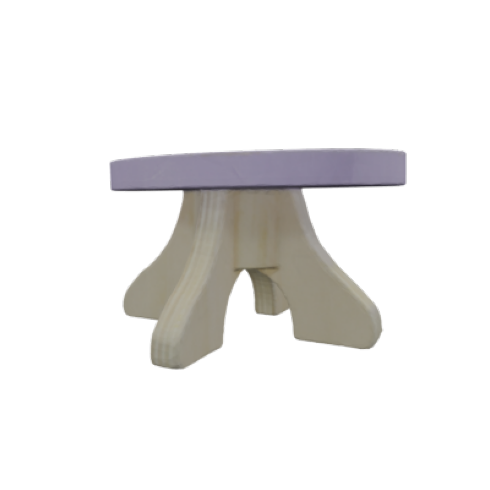

: 

In [ ]:
# Disply example input  image
display_images(['/content/Make-a-Shape/examples/single_view/table.png'])

## Pretraitement Depth Anything v2

On estime la profondeur avec **DA v2** (`depth-anything/Depth-Anything-V2-Large-hf`), on normalise en \[0,1\], puis on construit une image **3 canaux** en répliquant la profondeur sur R=G=B. Si `DIVIDE_BY_THREE` est activé, chaque canal vaut la profondeur normalisée **÷ 3** (image plus sombre, moins de saturation).

Exécuter la cellule suivante **avant** le `run.py` single-view.

In [ ]:
import os
import numpy as np
from pathlib import Path
from PIL import Image
import torch

# retrouver la racine du repo (colab: souvent .../Make-a-Shape apres %cd)
def _repo_root():
	p = Path.cwd()
	for _ in range(16):
		if (p / "run.py").is_file():
			return p
		if p.parent == p:
			break
		p = p.parent
	return Path("/content/Make-a-Shape")

ROOT = _repo_root()
INPUT_RGB_PATH = ROOT / "examples/single_view/table.png"
DA2_TRIPLE_PATH = ROOT / "examples/single_view/table_da2_triple.png"

# True => chaque canal = profondeur_norm / 3 (sinon copie x3 pleine echelle)
DIVIDE_BY_THREE = True

try:
	from transformers import pipeline
except ImportError:
	import subprocess, sys
	subprocess.check_call([sys.executable, "-m", "pip", "install", "-q", "transformers", "accelerate"])
	from transformers import pipeline

_dev = 0 if torch.cuda.is_available() else ("mps" if torch.backends.mps.is_available() else -1)
print("da2 device:", _dev)
_pipe = pipeline(
	"depth-estimation",
	model="depth-anything/Depth-Anything-V2-Large-hf",
	device=_dev,
)

raw = Image.open(INPUT_RGB_PATH).convert("RGB")
depth_t = _pipe(raw)["predicted_depth"]
d = depth_t.squeeze().cpu().numpy().astype(np.float32)
dmin, dmax = float(d.min()), float(d.max())
if dmax > dmin:
	dn = (d - dmin) / (dmax - dmin)
else:
	dn = np.zeros_like(d)

if DIVIDE_BY_THREE:
	v = (dn / 3.0 * 255.0).clip(0, 255)
else:
	v = (dn * 255.0).clip(0, 255)

u8 = v.astype(np.uint8)
rgb = np.stack([u8, u8, u8], axis=-1)
DA2_TRIPLE_PATH.parent.mkdir(parents=True, exist_ok=True)
Image.fromarray(rgb).save(DA2_TRIPLE_PATH)
print("image triple-canal (profondeur):", DA2_TRIPLE_PATH)

try:
	display_images([str(DA2_TRIPLE_PATH)])
except NameError:
	pass


: 

In [ ]:
from pathlib import Path
from IPython import get_ipython

def _repo_root():
	p = Path.cwd()
	for _ in range(16):
		if (p / "run.py").is_file():
			return p
		if p.parent == p:
			break
		p = p.parent
	return Path("/content/Make-a-Shape")

ROOT = _repo_root()
# entree = carte DA2 triple-canal (voir cellule au-dessus)
SV_IMG = ROOT / "examples/single_view/table_da2_triple.png"

get_ipython().system(
	f'python "{ROOT}/run.py" --model_name ADSKAILab/Make-A-Shape-single-view-20m '
	f'--images "{SV_IMG}" --output_dir "{ROOT}/examples" --output_format obj'
)


: 

In [ ]:
# Display generated 3D mesh
from pathlib import Path
import glob

def _repo_root():
	p = Path.cwd()
	for _ in range(16):
		if (p / "run.py").is_file():
			return p
		if p.parent == p:
			break
		p = p.parent
	return Path("/content/Make-a-Shape")

ROOT = _repo_root()
mesh_files = sorted(glob.glob(str(ROOT / "examples/table_da2_triple/*.obj")))
display_mesh(mesh_files[0])


: 

## Multi-view to 3D


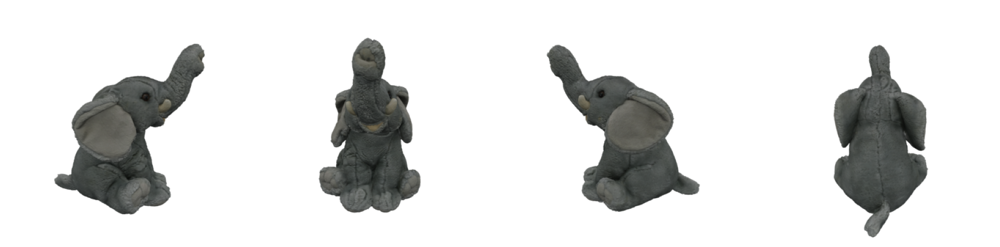

: 

In [ ]:
# Disply example input multiview images
display_images([
    '/content/Make-a-Shape/examples/multi_view/000.png',
    '/content/Make-a-Shape/examples/multi_view/006.png',
    '/content/Make-a-Shape/examples/multi_view/010.png',
    '/content/Make-a-Shape/examples/multi_view/026.png',
    ]
)

In [ ]:
# Generate 3D mesh conditioned on the multiview images using absolute paths
!python /content/Make-a-Shape/run.py --model_name ADSKAILab/Make-A-Shape-multi-view-20m --multi_view_images /content/Make-a-Shape/examples/multi_view/000.png /content/Make-a-Shape/examples/multi_view/006.png /content/Make-a-Shape/examples/multi_view/010.png /content/Make-a-Shape/examples/multi_view/026.png --output_dir /content/Make-a-Shape/examples --output_format obj

/usr/local/lib/python3.11/site-packages/timm/models/layers/__init__.py:49: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)
Loading model
checkpoint.ckpt: 100% 2.21G/2.21G [01:09<00:00, 31.7MB/s]
/usr/local/lib/python3.11/site-packages/pytorch_lightning/utilities/migration/utils.py:55: The loaded checkpoint was produced with Lightning v2.1.2, which is newer than your current Lightning version: v2.1.0
Biggest model is being used L-14
cond_emb_dim: 768
Input resolution: 224
Vocab size: 49408
Low avg used : 2.2
Entering the testing steps
EMA reloaded weight exists : True
Reloaded the weight for EMA models
Seed set to 42
100% 100/100 [00:29<00:00,  3.37it/s]


: 

In [ ]:
# Display generated 3D mesh
mesh_files = glob.glob('/content/Make-a-Shape/examples/000/*.obj')
display_mesh(mesh_files[0])

: 

## Voxel to 3D (32³ Resolution)

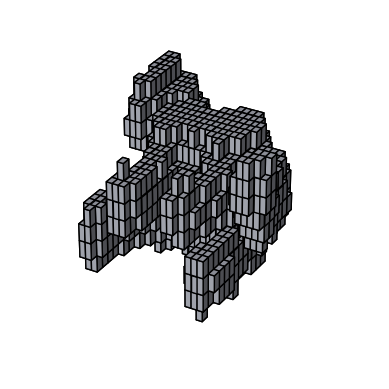

: 

In [ ]:
# Disply example input voxel
display_voxel('/content/Make-a-Shape/examples/voxel/horse_32.json')

In [ ]:
# Generate 3D mesh conditioned on the voxel using absolute paths
!python /content/Make-a-Shape/run.py --model_name ADSKAILab/Make-A-Shape-voxel-32res-20m --voxel_files /content/Make-a-Shape/examples/voxel/horse_32.json --output_dir /content/Make-a-Shape/examples --output_format obj

/usr/local/lib/python3.11/site-packages/timm/models/layers/__init__.py:49: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)
Loading model
checkpoint.ckpt: 100% 283M/283M [00:10<00:00, 28.2MB/s] 
/usr/local/lib/python3.11/site-packages/pytorch_lightning/utilities/migration/utils.py:55: The loaded checkpoint was produced with Lightning v2.1.2, which is newer than your current Lightning version: v2.1.0
Low avg used : 2.2
Entering the testing steps
EMA reloaded weight exists : True
Reloaded the weight for EMA models
Processing voxel file: /content/Make-a-Shape/examples/voxel/horse_32.json
Seed set to 42
100% 100/100 [00:28<00:00,  3.46it/s]


: 

In [ ]:
# Display generated 3D mesh
mesh_files = glob.glob('/content/Make-a-Shape/examples/horse_32/*.obj')
display_mesh(mesh_files[0])

: 